<h1 align='center'>Milestone 1: Proposal</h1>
<h3 align='center'>Group 5：</h3>
<h4 align='center'>Abby Ross | Joseph Distler | Nathan Dierkes | Viraj Vilas Rane | Xinyue Chen | Yinkai Xiong</h4>

<h2 align="center">Introduction</h2>

<h3>Business Problem: </h3>

Airbnb is a company that provides a platform users classified as homeowners to rent out rooms, or the entire house, to any of the Airbnb users classified as renters.  This is primarily done in high tourism locations, but is also fairly prevelant in most of the large US cities.  Airbnb would like to increase its user base by identifying potential hosts to convince them to use their property as a rental location. Airbnb receives a percentage of the profit that the rentals on their platform create; therefore it is in their best interest to grow the number of rental properties for their potential customers. The company has already gathered a large amount of data on its current listings and has come to our group to analyze said data. They would like to provide the hosts with suggestions for their property descriptions, which amenities to offer, etc., and use these values to predict the ratings, listing prices, booking percentage of available dates, and more. To pilot this idea, the company would like to focus on one city in the United States before rolling this predictive model out to other locations. The dataset to be used in this analysis will be from Inside Airbnb, specifically the Chicago, Illinois datasets. The company would like to use this analysis to determine the ideal property type, location, and amenities to look for potential rental locations, and then predict how the host’s actions (descriptions, response rate, etc.) would affect the listing’s potential.

<h3>Scenarios: </h3>

<h4>Price prediction</h4>

The hosts want to lease their properties on Airbnb, but they are not sure what prices they should put for their new properties (of differing types). They want to build and use a statistical model to predict the Airbnb rental trend next year. As the economy grows every year, Airbnb is looking for a new price range for their new properties. The hosts can use this price reference to determine whether they should list their properties on Airbnb. Airbnb can use this model to make their marketing plan to recruit their target partners (hosts). 

<h4>Customer satisfaction prediction</h4>

Customers are looking for properties to rent that fit their budget of expenditure in comparison with the amenities offered at the rental locations. Therefore, customers are looking for reliable feedback and rating system that aligns with what they are willing to pay to stay there. Airbnb would use this model to offer the customers the right properties, within their price range, to increase the chance of them using their platform. This model will be based on the feedback that the customer provides after visiting a particular property, and then will use this data to improve its recommendation system for future customers who look at the property. 

<h4>Recommendation system</h4>

As the customers are clicking on the property that they are interested in, Airbnb also offers the customers similar properties they might like. This allows the customers to explore more options related to their search criteria and increases the chances for the customer to go for the options suggested by Airbnb.


<h3>The result should help Airbnb to answer multiple questions regarding their future operations, including:</h3>
<h4>What will the price for a new property be next year (rise or fall)? (price prediction)</h4>
Observations that could help us to predict property price next year:

- Room types
- Amenities
- Zipcodes
- Latitude and longitude
- Distance from the center of the city


<h4>What rating score customers would give to a new property? (customer satisfaction prediction)</h4>
Observations that could help us to predict the satisfaction of customers for new properties:

- Keywords in “comments”
- Historical comments rating
- Host response time and/or rate
- Host’s “about me” field
- Property description keywords
- Neighborhood overview entered by the host
- Amenities

<h4>What types of housings should the company recommend to customers after they click on one specific housing? (Recommendation system)</h4>
Observations that could help us to recommend housing to Guests:

- Room type
- Location
- Amenities


<h2 align="center">Data Source and Collection</h2>

<h3>Data Source</h3>

The main data is sourced from the Inside Airbnb website at: http://insideairbnb.com/get-the-data.html.  This data was collected by Airbnb and posted online for use by anyone.

City of Chicago latitude and longitude sourced from: https://www.latlong.net/place/chicago-il-usa-1855.html

<h3>Key Information</h3>

Key information in the dataset includes, but is not limited to:

- Listing ID, name, description, and neighborhood overview, location (including longitude and latitude), various descriptors (property type, beds, bathrooms, amenities, price, etc.)

- Host ID, name, location, “about” description, response rate and time, acceptance rate, number of listings, if they have a profile picture uploaded, if their identity has been verified

- Review information including ratings on listing accuracy, cleanliness, location, etc.


<h2 align="center">Data Manipulation</h2>

In order to start the data analysis, we will need to import a variety of packages.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import math
import statsmodels.api as sm
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from wordcloud import WordCloud, STOPWORDS
import folium
from folium import plugins
from folium.plugins import HeatMap
import json
from glob import glob

# kindly make sure to install folium and wordcloud packages before executing the code.

We will read in the data, which was downloaded from the Airbnb website (InsideAirbnb) and look at its info.

In [2]:
# Read in data
dat = pd.read_csv('listings.csv')
dat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6455 entries, 0 to 6454
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            6455 non-null   int64  
 1   listing_url                                   6455 non-null   object 
 2   scrape_id                                     6455 non-null   int64  
 3   last_scraped                                  6455 non-null   object 
 4   name                                          6455 non-null   object 
 5   description                                   6441 non-null   object 
 6   neighborhood_overview                         4703 non-null   object 
 7   picture_url                                   6455 non-null   object 
 8   host_id                                       6455 non-null   int64  
 9   host_url                                      6455 non-null   o

We can see that there are 74 columns, and 6,366 observations, however some values are missing in various columns.

<h3>Data Cleansing</h3>

<h4>Drop off irrelevant columns:</h4>

* URLs will not be useful for analysis
* Empty columns will not be useful: **'neighborhood_group_cleansed', 'bathrooms', 'calendar_updated'**
* The **'neighborhood'** column only has blank values or "Chicago, Illinois, United States" value, making it useless
* **'host_listings_count'** and **'host_total_listings_count'** are essentially duplicate information, we will use the **'calculated_host_listings_xxx'** columns instead
* **'scrape_id'** is all the same value and not useful for our needs
* **'calendar_last_scraped'** can be dropped as well since it is the same value as **'last_scraped'**

In [3]:
# Drop url columns
dat = dat.drop(['listing_url','host_url','host_thumbnail_url','host_picture_url','picture_url'], axis = 1)

# Drop empty columns
dat = dat.drop(['neighbourhood_group_cleansed','bathrooms','calendar_updated'], axis = 1)

# Drop rest
dat = dat.drop(['neighbourhood','host_listings_count','host_total_listings_count','scrape_id','calendar_last_scraped'], axis = 1)

Let us check for duplicate values and columns.

In [4]:
print ("Dataframe shape prior to removing duplicates: " + str(dat.shape))
dat = dat.drop_duplicates()
dat = dat.loc[:,~dat.columns.duplicated()]
print ("Dataframe shape after removing duplicates: " + str(dat.shape))

Dataframe shape prior to removing duplicates: (6455, 61)
Dataframe shape after removing duplicates: (6455, 61)


We can see that the dataframe did not include any duplicate observations.

<h4>Bathrooms Column:</h4>

In [5]:
dat['bathrooms_text'].sample(10)

2101            1 bath
1975            1 bath
5312     1 shared bath
4937     1 shared bath
1880     1 shared bath
838      1 shared bath
5386            1 bath
5275            1 bath
1552         1.5 baths
650     1 private bath
Name: bathrooms_text, dtype: object

Looking at the 'bathrooms_text' column, we see that it is not very usable in its current state.  We will split the bathroom text column into two: one containing a float variable for the number of bathrooms, and the other an additional descriptor of the bathroom (shared/private).

In [6]:
# First let us make all text lowercase to simplify string manipulation
dat['bathrooms_text'] = dat['bathrooms_text'].str.lower()

# Next we must convert any text 'half' to 0.5 so it is included in the subsequent number extraction
dat['bathrooms_text'] = dat['bathrooms_text'].str.replace(r'(half)+','0.5', regex = True)

# Then extract the numbers into the new 'bathrooms' float32 data type column
dat['bathrooms'] = dat['bathrooms_text'].str.extract(r'(\d+\.?\d*)', expand = True).astype('float')

# This leaves us with only float and NaN values
dat['bathrooms'].unique()

array([ 1. ,  2. ,  1.5,  3. ,  2.5,  0. ,  3.5, 11. ,  nan,  0.5,  4. ,
        5. ,  4.5, 11.5,  6.5,  7. ,  5.5,  6. ,  8. , 12.5, 10. ,  7.5])

Above are the unique values left for the float variable in the column 'bathrooms'. The test portion requires a little more refining:

In [7]:
# Remove the text 'bath', unnecessary symbols and whitespace, then extract the leftover text

dat['bathrooms_text'] = dat['bathrooms_text'].str.replace(r'(bath)s*|(Bath)s*','', regex = True)
dat['bathrooms_text'] = dat['bathrooms_text'].str.replace(r' +|\.+|\-+','', regex = True)
dat['bathrooms_text'] = dat['bathrooms_text'].str.extract(r'(\D+)')
dat['bathrooms_text'].count()

1581

In [8]:
dat['bathrooms_text'].unique()

array(['shared', nan, 'private'], dtype=object)

This leaves us with only 1,587 observations that contain one of the bathroom descriptors, 'shared' or 'private'; the rest are missing values since the original data did not contain text for them.

<h4>DateTime Columns:</h4>

Next, let's convert the datetime columns into the proper datatype.

In [9]:
# Convert dates to datetime data type

for x in ['last_scraped', 'host_since', 'first_review', 'last_review']:
    dat[x] = pd.to_datetime(dat[x])

In order to see the length of time that a host has been active on the platform, we will create a new column called 'host_age' which we can visualize later.  Note: this will also be converted to a float variable instead of a timedelta variable.

In [10]:
dat['host_age'] = (dat['last_scraped'] - dat['host_since'])/pd.to_timedelta(1, unit='D')

In [11]:
dat['host_age'].sample(5)

5279    3359.0
5569    1212.0
1998    1250.0
4409    1600.0
6118     165.0
Name: host_age, dtype: float64

<h4>'Rate' Columns:</h4>

In [12]:
dat['host_response_rate'].sample(5)

5568    100%
5912    100%
407      94%
2096    100%
1187    100%
Name: host_response_rate, dtype: object

We can see that we will need to convert the percentage columns ('host_response_rate' and 'host_acceptance_rate') into float variables.

In [13]:
# Strip the percentage sign and convert host response rate and acceptance rate columns into float

dat['host_response_rate'] = dat['host_response_rate'].str.replace(r'(\D)','', regex = True).astype('float')/100
dat['host_acceptance_rate'] = dat['host_acceptance_rate'].str.replace(r'(\D)','', regex = True).astype('float')/100
dat['host_response_rate'].sample(5)

4859    0.9
2652    1.0
3219    NaN
235     1.0
4537    1.0
Name: host_response_rate, dtype: float64

<h4>Boolean Columns:</h4>

In [14]:
dat['host_is_superhost'].unique()

array(['t', 'f', nan], dtype=object)

We will convert the 't' and 'f' values to binary float values in all of the boolean columns for later analysis, where 1 will mean "True".

In [15]:
# Map all boolean columns to float 1/0 values

dat['host_is_superhost'] = dat['host_is_superhost'].map({'t':1,'f':0}).astype('float')
dat['host_has_profile_pic'] = dat['host_has_profile_pic'].map({'t':1,'f':0}).astype('float')
dat['host_identity_verified'] = dat['host_identity_verified'].map({'t':1,'f':0}).astype('float')
dat['has_availability'] = dat['has_availability'].map({'t':1,'f':0}).astype('float')
dat['instant_bookable'] = dat['instant_bookable'].map({'t':1,'f':0}).astype('float')

In [16]:
dat['host_is_superhost'].unique()

array([ 1.,  0., nan])

<h4>Price Column:</h4>

Convert the price column to a float data type.

In [17]:
# Extract only the decimal digits and the period

dat['price'] = dat['price'].str.extract(r'(\d+\.\d+)').astype('float')

In [18]:
dat['price'].sample(5)

2738     75.0
1377    218.0
840      29.0
6106     69.0
4457    153.0
Name: price, dtype: float64

<h4>License Column:</h4>

Since we will not be able to use the individual license numbers, we will convert this column into a categorical variable, where 1 means the listing has a license, and 0 does not.  For our purposes, we will consider a license that is still pending as not having a license (i.e. 0).

In [19]:
dat['license'].sample(10)

6280                 R21000069684
890                  R17000015121
5416                          NaN
1643    City registration pending
4064                          NaN
2483                 R18000034179
3331    City registration pending
2662                  STR-3548684
6420                 R20000059761
2008                 R18000025973
Name: license, dtype: object

In [20]:
dat['license'] = dat['license'].fillna(0)
dat.loc[dat['license'].str.contains('pending', na=False), 'license'] = 0
dat.loc[dat['license'] != 0, 'license'] = 1
dat['license'] = dat['license'].astype('float')

In [21]:
dat['license'].sample(10)

1694    0.0
514     1.0
5115    1.0
482     1.0
5672    1.0
1923    1.0
4666    0.0
3468    1.0
3386    0.0
5691    1.0
Name: license, dtype: float64

<h4>Ratings</h4>

Let us create an average rating column that includes the average of all review scores values.

In [22]:
dat['avg_rating'] = dat[['review_scores_rating','review_scores_accuracy','review_scores_cleanliness',
                         'review_scores_checkin','review_scores_communication','review_scores_location',
                        'review_scores_value']].mean(axis = 1)
dat['avg_rating'].describe()

count    5438.000000
mean        4.747269
std         0.484075
min         0.000000
25%         4.721429
50%         4.857143
75%         4.932857
max         5.000000
Name: avg_rating, dtype: float64

<h4>Missing Values</h4>

For the column **'host_response_time'**, convert to binary value and create a new column represent if a host respose is within a day.

In [23]:
#Categorical within an hour,within a few hours, within a day to 1(true), NaN,a few days or more to 0(false) 
dat['host_response_inADay'] = dat.host_response_time.map({'within an hour': 1, 
                                                        'within a few hours': 1, 
                                                        'within a day':1, 
                                                        'a few days or more':0, 
                                                        np.nan:0})

For columns: **description**, **neighborhood_overview**, **host_location**, **host_about**, **host_neighbourhood**
     using 'Unknown' to fill the missing value, because these columns does not have direct effect on project topic.

In [24]:
dat['description'].fillna(value='Unknown', inplace=True)
dat['neighborhood_overview'].fillna(value='Unknown', inplace=True)
dat['host_location'].fillna(value='Unknown', inplace=True)
dat['host_about'].fillna(value='Unknown', inplace=True)
dat['host_neighbourhood'].fillna(value='Unknown', inplace=True)

For columns: **host_name**, **host_since**, **host_has_profile_pic**, **host_identity_verified**, it is easy to see below these rows contains many NaN value, so drop directly.

In [25]:
dat = dat.dropna(subset=['host_name'])

In [26]:
nullseries = dat.isnull().sum()
print(nullseries[nullseries > 0])

host_response_time             1368
host_response_rate             1368
host_acceptance_rate           1160
bathrooms_text                 4865
bedrooms                        567
beds                             97
first_review                   1017
last_review                    1017
review_scores_rating           1017
review_scores_accuracy         1050
review_scores_cleanliness      1050
review_scores_checkin          1051
review_scores_communication    1052
review_scores_location         1051
review_scores_value            1051
reviews_per_month              1017
bathrooms                         6
avg_rating                     1017
dtype: int64


For columns: **bedrooms** and **beds**, using mode to fill missing value, because fill with natural value to make the result less biased. 

In [27]:
print(dat['bedrooms'].mode())
print(dat['beds'].mode())
print(dat['bathrooms'].mode())

0    1.0
dtype: float64
0    1.0
dtype: float64
0    1.0
dtype: float64


In [28]:
dat['bedrooms'].fillna(value=1, inplace=True)
dat['beds'].fillna(value=1, inplace=True)
dat['bathrooms'].fillna(value=1, inplace=True)

For columns: **first_review**, **last_review**, **review_scores_rating**, **review_scores_accuracy**, **review_scores_cleanliness**, **review_scores_checkin**, **review_scores_communication**, **review_scores_location**, **review_scores_value**, **reviews_per_month**, most missing value caused by 'number_of_reviews'==0. So, fill those missing value with 0.0. Later review analysis process will exclude these rows since no number of reviews.

In [29]:
# first_review, last_review, will not be filled since no value suitable
dat['review_scores_rating'].fillna(value=0.0, inplace=True)

dat['review_scores_accuracy'].fillna(value=0.0, inplace=True)

dat['review_scores_cleanliness'].fillna(value=0.0, inplace=True)

dat['review_scores_checkin'].fillna(value=0.0, inplace=True)

dat['review_scores_communication'].fillna(value=0.0, inplace=True)

dat['review_scores_location'].fillna(value=0.0, inplace=True)

dat['review_scores_value'].fillna(value=0.0, inplace=True)

dat['reviews_per_month'].fillna(value=0.0, inplace=True)

In [30]:
nullseries = dat.isnull().sum()
print(nullseries[nullseries > 0])

host_response_time      1368
host_response_rate      1368
host_acceptance_rate    1160
bathrooms_text          4865
first_review            1017
last_review             1017
avg_rating              1017
dtype: int64


<h2 align="center">Data Exploration and Visualization</h2>

Let us explore the data in the dataset.

<h4>Unique Hosts</h4>

First, how many unique hosts are there?

In [31]:
print("There are %s unique hosts in the dataset." %dat['host_id'].nunique())

There are 3380 unique hosts in the dataset.


How many listings does each host have in the Chicago area?

In [32]:
listings_by_host = dat['host_id'].value_counts()
listings_by_host.describe()

count    3380.000000
mean        1.906805
std         5.870549
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max       283.000000
Name: host_id, dtype: float64

In [33]:
listings_by_host[listings_by_host > 1].count()

809

Here we can see that out of the 3,371 unique hosts, 799 have more than one listing in the Chicago area.  Interestingly, there is one host id with 260 listings.

Let's graph this data to see the distribution of hosts with differing numbers of listings.

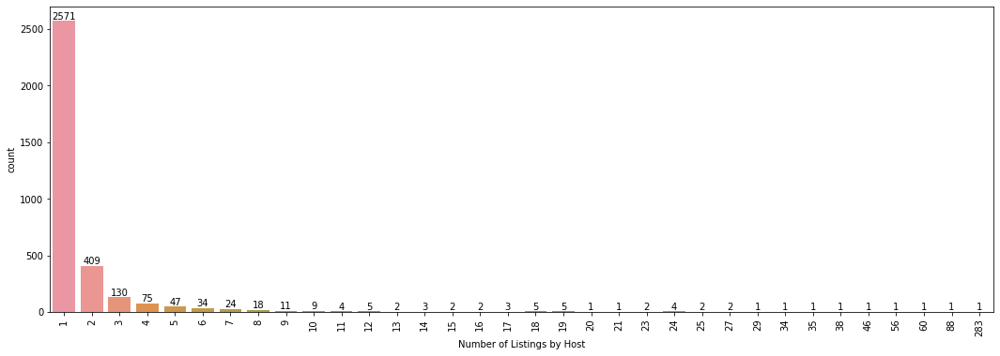

In [34]:
plt.figure(figsize=(18,6))
p = sb.countplot(x=listings_by_host, order=sorted(listings_by_host.unique()))
p.set_xticklabels(labels=p.get_xticklabels(),rotation=90)
p.bar_label(p.containers[0])
plt.xlabel('Number of Listings by Host')
plt.show()

It is obvious that a vast majority of hosts have only one listing in the Chicago area.  Let us look at the outliers.

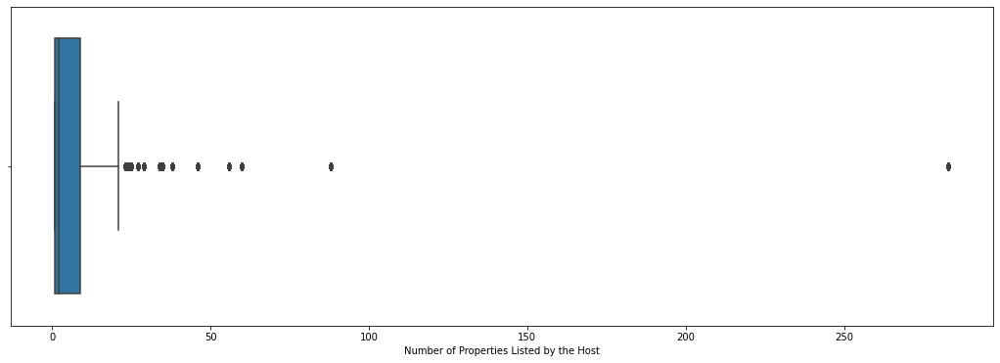

In [35]:
plt.figure(figsize=(18,6))
sb.boxplot(x=dat['calculated_host_listings_count'])
plt.xlabel('Number of Properties Listed by the Host')
plt.show()

In [36]:
#Calculate the lower and upper quartile values
q1 = np.quantile(dat['calculated_host_listings_count'], 0.25)
q3 = np.quantile(dat['calculated_host_listings_count'], 0.75)
#calculate the upper whisker only, since no outliers are below the lower
whishi = q3 + 1.5*(q3-q1)
#create a dataframe where the income is higher than the upper whisker value
out_list = dat[dat['calculated_host_listings_count']>whishi]
print('The upper whisker on the box plot is at ' + str(whishi) + ', with ' +
      str(len(out_list['id'])) + ' listings as outliers past this value.')

The upper whisker on the box plot is at 21.0, with 915 listings as outliers past this value.


<h4>Listing License</h4>

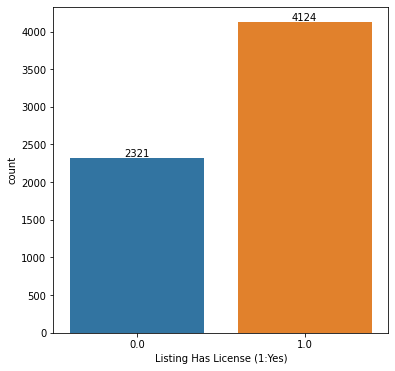

In [37]:
plt.figure(figsize=(6,6))
p = sb.countplot(x='license',data = dat)
p.bar_label(p.containers[0])
plt.xlabel('Listing Has License (1:Yes)')
plt.show()

A majority of the listings have a license, but it is not a large majority.

<h4>Host Response Time</h4>

In [38]:
dat['host_response_time'].unique()

array(['within an hour', 'within a few hours', nan, 'within a day',
       'a few days or more'], dtype=object)

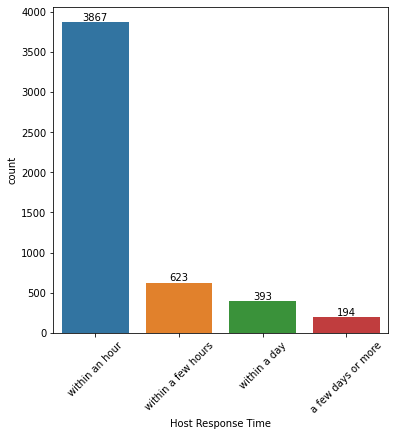

In [39]:
plt.figure(figsize=(6,6))
p = sb.countplot(x='host_response_time',data = dat)
p.set_xticklabels(labels=p.get_xticklabels(),rotation=45)
p.bar_label(p.containers[0])
plt.xlabel('Host Response Time')
plt.show()

Here we can see there are four categories for the response time.  Let's define a system for rating the response time by using floating numbers.  We will assign the values in hours and as follows:
 * 'within an hour' = 1 hour
 * 'within a few hours' = 5 hours
 * 'within a day' = 24 hours
 * 'a few days or more' = 48 hours

In [40]:
dat['host_response_time_float'] = dat['host_response_time'].map({'within an hour':1,'within a few hours':5,
                                                           'within a day':24,'a few days or more':48}).astype('float')
dat['host_response_time_float'].unique()

array([ 1.,  5., nan, 24., 48.])

<h4>Host Verifications</h4>

In order to simplify future analysis, let us count the number of verifications the host has and list this in a new column.

In [41]:
dat['host_verifications'].sample(5)

2083         ['email', 'phone', 'jumio', 'government_id']
5693    ['email', 'phone', 'offline_government_id', 's...
3529    ['email', 'phone', 'offline_government_id', 'g...
6409                                            ['phone']
5927                 ['email', 'phone', 'reviews', 'kba']
Name: host_verifications, dtype: object

We can see that the verifications are separated by a comma, so we will use this to count the number of verifications each host has.

In [42]:
dat['no_of_verif'] = dat['host_verifications'].str.count(r',') + 1
dat.loc[:, ['host_verifications','no_of_verif']].head()

,host_verifications,no_of_verif
0,"['email', 'phone', 'reviews', 'manual_offline'...",6
1,"['email', 'phone', 'reviews', 'jumio', 'offlin...",8
2,"['email', 'phone', 'reviews', 'jumio', 'govern...",6
3,"['email', 'phone', 'reviews', 'offline_governm...",7
4,"['email', 'phone', 'facebook', 'reviews', 'kba']",5


In order to catch any observations where hosts have no verifications, we will set the number of verifications to zero where the host_verifications = 'None'.  This is important since the code above would have counted both 'none' and an observation without a comma (i.e. only one verification) as 1.

In [43]:
dat['no_of_verif'] = np.where(dat['host_verifications'] == 'None', 0, dat['no_of_verif'])

In [44]:
dat['no_of_verif'].describe()

count    6445.000000
mean        5.523972
std         2.342015
min         1.000000
25%         4.000000
50%         6.000000
75%         7.000000
max        12.000000
Name: no_of_verif, dtype: float64

On average, hosts have about 5-6 different identity verifications. 

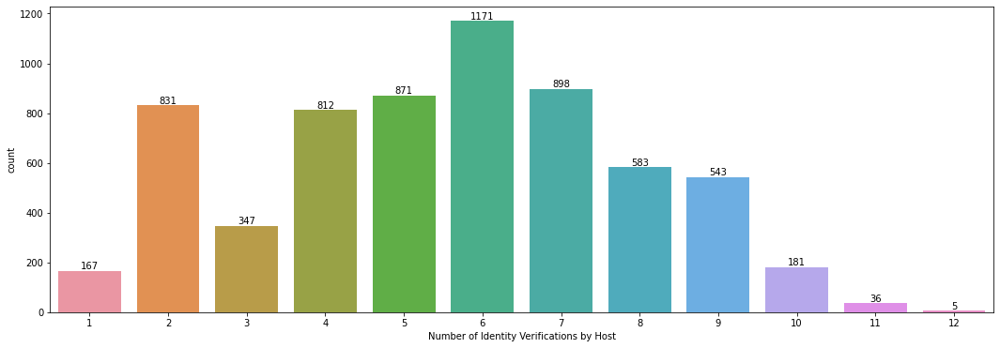

In [45]:
plt.figure(figsize=(18,6))
p = sb.countplot(x='no_of_verif',data = dat)
p.bar_label(p.containers[0])
plt.xlabel('Number of Identity Verifications by Host')
plt.show()

<h4>Amenities</h4>

Here we repeat the same process for number of amenities listed.

In [46]:
dat['no_of_amen'] = dat['amenities'].str.count(r',') + 1
dat.loc[:, ['amenities','no_of_amen']].head()

,amenities,no_of_amen
0,"[""Refrigerator"", ""Microwave"", ""Body soap"", ""Fr...",52
1,"[""Refrigerator"", ""Microwave"", ""Wifi"", ""Room-da...",30
2,"[""Refrigerator"", ""Microwave"", ""Wifi"", ""Heating...",33
3,"[""Refrigerator"", ""Microwave"", ""Wifi"", ""Heating...",31
4,"[""Lock on bedroom door"", ""Wifi"", ""Heating"", ""C...",22


In [47]:
dat['no_of_amen'].describe()

count    6445.000000
mean       31.798759
std        11.157150
min         1.000000
25%        24.000000
50%        31.000000
75%        38.000000
max        83.000000
Name: no_of_amen, dtype: float64

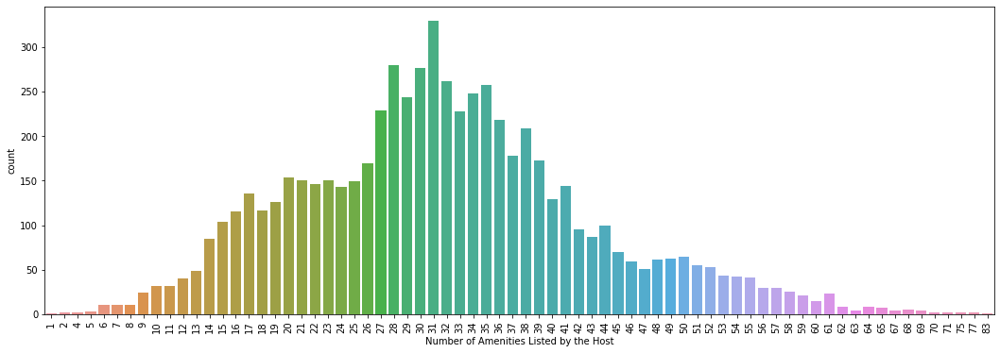

In [48]:
plt.figure(figsize=(18,6))
p = sb.countplot(x='no_of_amen',data = dat)
p.set_xticklabels(labels=p.get_xticklabels(),rotation=90)
plt.xlabel('Number of Amenities Listed by the Host')
plt.show()

Let us take a closer look to see what outliers are in this variable.

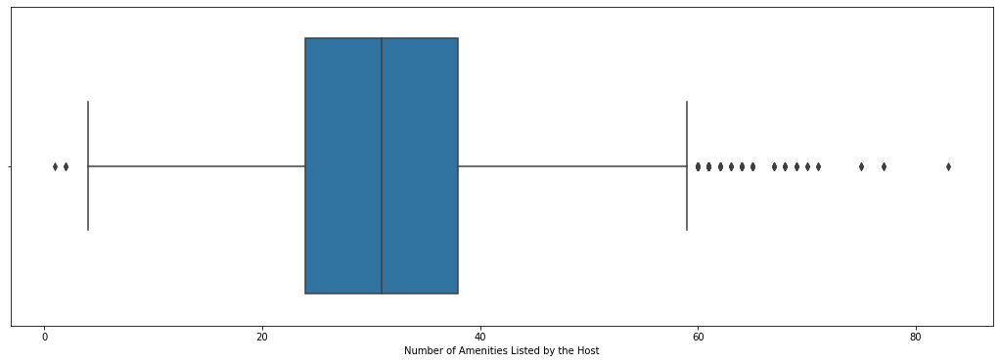

In [49]:
plt.figure(figsize=(18,6))
sb.boxplot(x=dat['no_of_amen'])
plt.xlabel('Number of Amenities Listed by the Host')
plt.show()

In [50]:
#Calculate the lower and upper quartile values
q1 = np.quantile(dat['no_of_amen'], 0.25)
q3 = np.quantile(dat['no_of_amen'], 0.75)
#calculate the upper whisker only, since no outliers are below the lower
whishi = q3 + 1.5*(q3-q1)
whislo = q1 - 1.5*(q3-q1)
#create a dataframe where the income is higher than the upper whisker value
out_list_hi = dat[dat['no_of_amen']>whishi]
out_list_lo = dat[dat['no_of_amen']<whislo]

print('\nThe upper whisker on the box plot is at ' + str(whishi) + ', with ' +
      str(len(out_list_hi['id'])) + ' listings as outliers above this value.')
print('\n')
print('The lower whisker on the box plot is at ' + str(whislo) + ', with ' +
      str(len(out_list_lo['id'])) + ' listings as outliers below this value.')


The upper whisker on the box plot is at 59.0, with 88 listings as outliers above this value.


The lower whisker on the box plot is at 3.0, with 3 listings as outliers below this value.


<h4>Distance from Center of Chicago</h4>

Let's calculate the distance of the listings from the center of the city of Chicago.  We will use the following coordinates: 41.8781° N, 87.6298° W.

We will use the Haversine formula to calculate the distance in miles.  In order to do so, we will first define a function to perform the calculation.

In [51]:
# Coordinates for center of Chicago in degrees
lat1 = 41.881832
long1 = -87.623177

# Constant, radius of the Earth in miles
r = 3958.8

# Define a function to calculate the distance
def haversine(lat2, long2):
    # First convert degrees into radians:
    rlat1 = lat1 * (math.pi / 180)
    rlat2 = lat2 * (math.pi / 180)
    rlong1 = long1 * (math.pi / 180)
    rlong2 = long2 * (math.pi / 180)
    
    # Calculate the differnce between the latitudes and longitudes
    dlat = rlat1 - rlat2
    dlong = rlong1 - rlong2
    
    # Use the Haversine formula (broken into 3 terms for simplification here)
    a = (math.sin(dlat / 2) ** 2)         # First term
    b = math.cos(rlat1) * math.cos(rlat2) # Second term
    c = (math.sin(dlong / 2) ** 2)        # Third term
    e = math.sqrt(a + b * c)
    d = 2 * r * e                         # where r is the radius of the Earth
    return d

Then, apply the formula to each observation in the data set, returning the answer in a new column for the distance from the center of the city.

In [52]:
dat['d_center'] = dat.apply(
    lambda row: haversine(row['latitude'], row['longitude']),
    axis=1)
dat['d_center'].sample(5)

3171    4.292430
2064    2.905016
2191    5.649116
2016    5.179024
5837    1.324967
Name: d_center, dtype: float64

In [53]:
dat['d_center'].describe()

count    6445.000000
mean        4.337707
std         2.731017
min         0.091059
25%         2.091536
50%         4.056507
75%         6.004136
max        16.529282
Name: d_center, dtype: float64

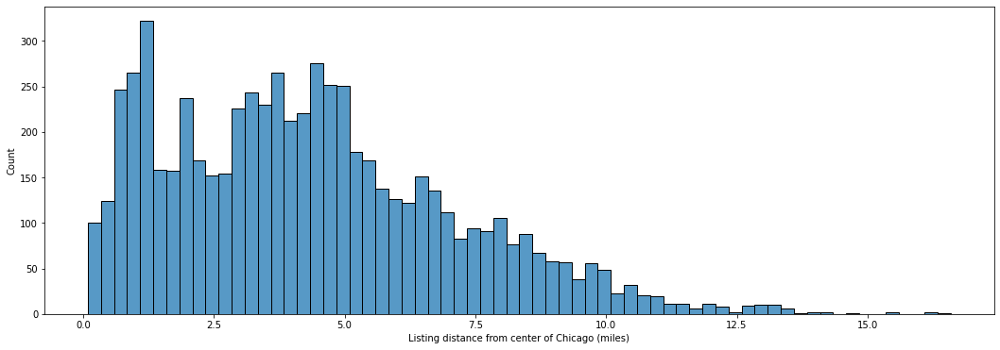

In [54]:
plt.figure(figsize=(18,6))
p = sb.histplot(x='d_center',data = dat,binwidth=0.25)
plt.xlabel('Listing distance from center of Chicago (miles)')
plt.show()

The plot shows a skew towards the center of the city, which makes sense that a larger number of listings would be closer to the center.

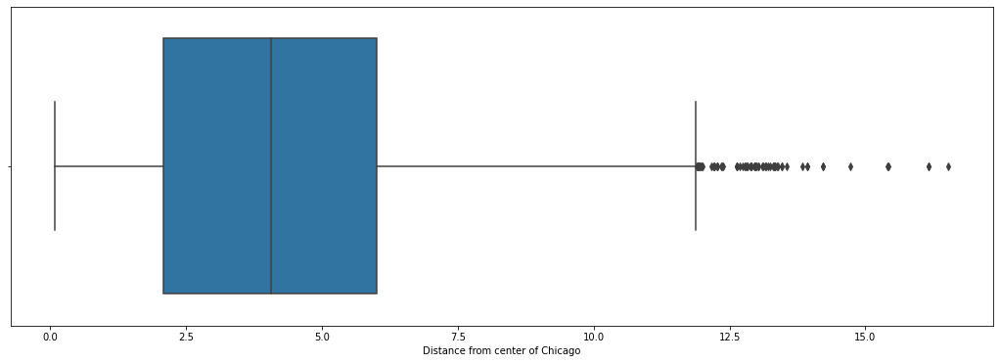

In [55]:
plt.figure(figsize=(18,6))
sb.boxplot(x=dat['d_center'])
plt.xlabel('Distance from center of Chicago')
plt.show()

In [56]:
#Calculate the lower and upper quartile values
q1 = np.quantile(dat['d_center'], 0.25)
q3 = np.quantile(dat['d_center'], 0.75)
#calculate the upper whisker only, since no outliers are below the lower
whishi = q3 + 1.5*(q3-q1)
whislo = q1 - 1.5*(q3-q1)
#create a dataframe where the income is higher than the upper whisker value
out_list_hi = dat[dat['d_center']>whishi]
out_list_lo = dat[dat['d_center']<whislo]

print('\nThe upper whisker on the box plot is at ' + str(round(whishi,2)) + ', with ' +
      str(len(out_list_hi['id'])) + ' listings as outliers above this value.')


The upper whisker on the box plot is at 11.87, with 65 listings as outliers above this value.


<h4>Property and Room Types</h4>

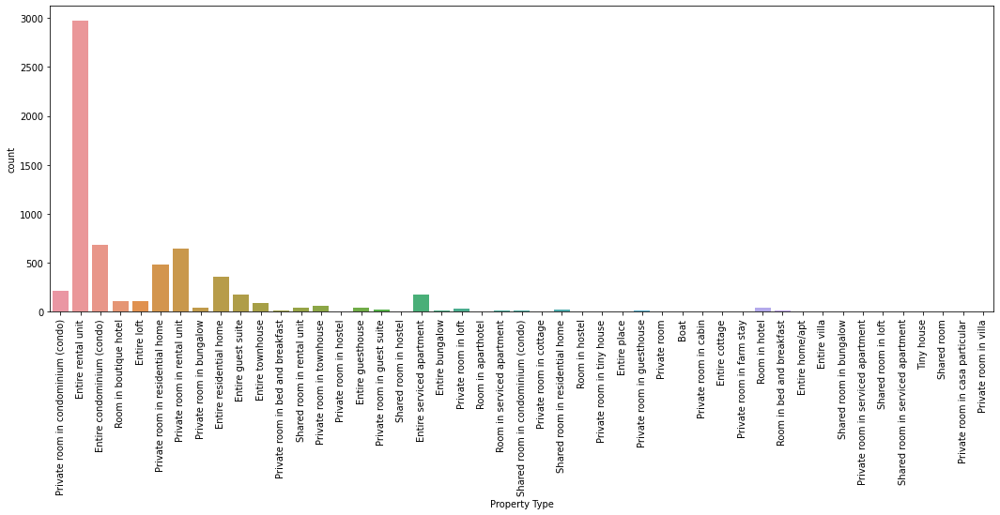

In [57]:
plt.figure(figsize=(18,6))
p = sb.countplot(x='property_type',data = dat)
p.set_xticklabels(labels=p.get_xticklabels(),rotation=90)
plt.xlabel('Property Type')
plt.show()

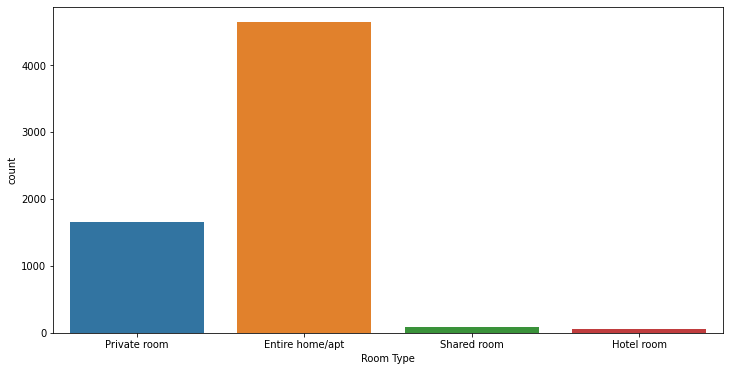

In [58]:
plt.figure(figsize=(12,6))
p = sb.countplot(x='room_type',data = dat)
plt.xlabel('Room Type')
plt.show()

In [59]:
print("The two graphs above show the most common type of listing is an entire apartment.  " + 
      "With the largest property type being 'entire apartment' at %s observations. \n"
     %(dat['property_type'].values == 'Entire apartment').sum())

print("In the room type category, there are %s observations for 'Entire home/apt'"
     %(dat['room_type'].values == 'Entire home/apt').sum())

The two graphs above show the most common type of listing is an entire apartment.  With the largest property type being 'entire apartment' at 0 observations. 

In the room type category, there are 4639 observations for 'Entire home/apt'


<h3>Additional Box Plots</h3>

<h4>Price Outliers</h4>

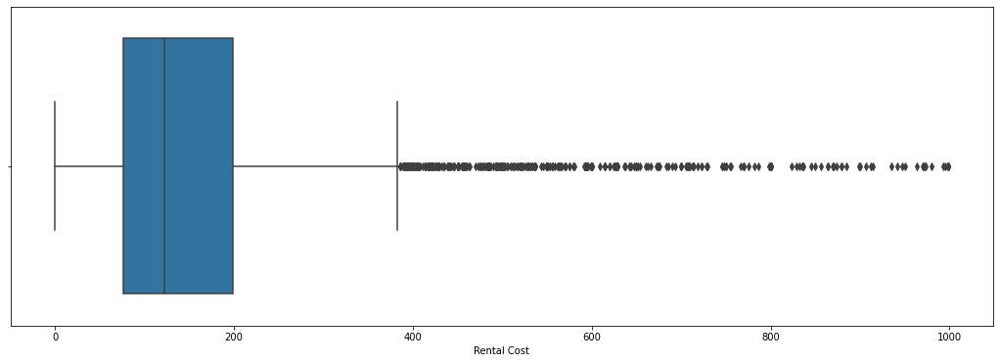

In [60]:
plt.figure(figsize=(18,6))
sb.boxplot(x=dat['price'])
plt.xlabel('Rental Cost')
plt.show()

In [61]:
#Calculate the lower and upper quartile values
q1 = np.quantile(dat['price'], 0.25)
q3 = np.quantile(dat['price'], 0.75)
#calculate the upper whisker only, since no outliers are below the lower
whishi = q3 + 1.5*(q3-q1)
#whislo = q1 - 1.5*(q3-q1)
#create a dataframe where the income is higher than the upper whisker value
out_list_hi = dat[dat['price']>whishi]
#out_list_lo = dat[dat['d_center']<whislo]

print('\nThe upper whisker on the box plot is at $' + str(whishi) + ', with ' +
      str(len(out_list_hi['id'])) + ' listings as outliers above this value.')


The upper whisker on the box plot is at $383.5, with 472 listings as outliers above this value.


<h3>Regression Plots</h3>

<h4>Price v. Distance from center of city</h4>

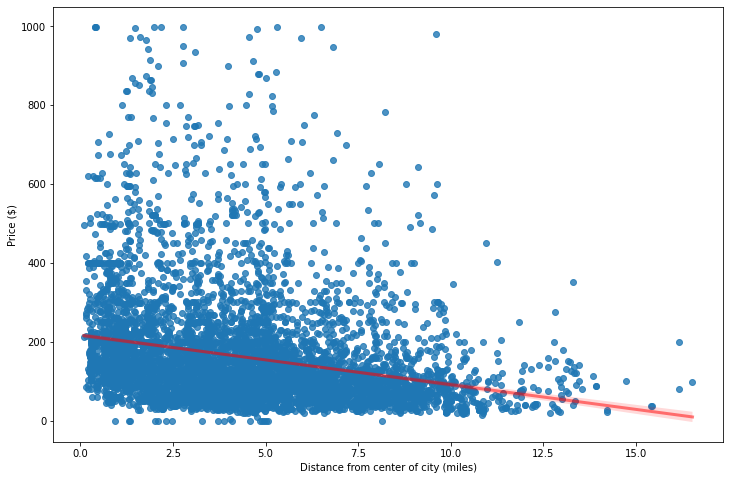

In [62]:
plt.figure(figsize=(12,8))
sb.regplot(x="d_center", y="price", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Distance from center of city (miles)')
plt.ylabel('Price ($)')
plt.show()

The regression plot shows a correlation between the distance from the center of the city and the price of the listing.  In general, the listings closer to the center of the city are worth more than the ones further away.  This makes sense, as property values are generally higher in more populated areas.

<h4>Regression Analysis and Prediction of Price based on distance from the city</h4>

We can use these data fields to make a prediction of price based on the distance from the city.

In [63]:
y = dat['price']
X = pd.DataFrame({'Distance':dat['d_center'],
                 'Const':1})

mod = sm.OLS(y,X)
fit = mod.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     424.3
Date:                Sat, 04 Dec 2021   Prob (F-statistic):           2.38e-91
Time:                        17:45:30   Log-Likelihood:                -40689.
No. Observations:                6445   AIC:                         8.138e+04
Df Residuals:                    6443   BIC:                         8.139e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Distance     -12.5471      0.609    -20.598      0.000     -13.741     -11.353
Const        216.7184      3.122     69.411      0.000     210.598     222.839
==============================================================================
Omnibus:                     3469.406   Durbin-Watson:                   1.813
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            26532.411
Skew:                           2.507   Prob(JB):                         0.00
Kurtosis:                      11.582   Cond. No.                         9.89
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Based on the above OLS model, we can say that on average a property that is 1 mile further from the center of the city than another would be $12.73/night cheaper.

<h4>Price v. Number of Amenities</h4>

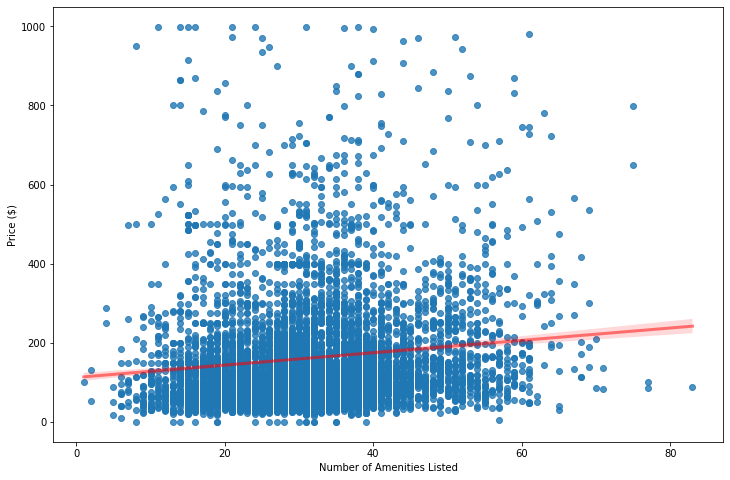

In [64]:
plt.figure(figsize=(12,8))
sb.regplot(x="no_of_amen", y="price", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Number of Amenities Listed')
plt.ylabel('Price ($)')
plt.show()

On average, the listings with more amenities listed are also posted for a higher rental price.

<h4>Regression Analysis and Prediction of Price based on Amenities</h4>

Again, we can use this data to develop a regression model to predict a property's price based on the number of amenities that are listed in the field.

In [65]:
y = dat['price']
X = pd.DataFrame({'Number of Amenities':dat['no_of_amen'],
                 'Const':1})

mod = sm.OLS(y,X)
fit = mod.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     104.6
Date:                Sat, 04 Dec 2021   Prob (F-statistic):           2.26e-24
Time:                        17:45:32   Log-Likelihood:                -40842.
No. Observations:                6445   AIC:                         8.169e+04
Df Residuals:                    6443   BIC:                         8.170e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Number of Amenities     1.5620      0.153     10.229      0.000       1.263       1.861
Const                 112.6244      5.146     21.887      0.000     102.537     122.712
==============================================================================
Omnibus:                     3399.781   Durbin-Watson:                   1.777
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            24677.189
Skew:                           2.465   Prob(JB):                         0.00
Kurtosis:                      11.221   Cond. No.                         102.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Here we can use this model to make predictions based on new properties.  For example, if a property were to have 35 amenities listed we can predict the listing price to be about (1.76 x 35) + 104.40 = $166/night.

<h4>Average Rating v. Response Time</h4>

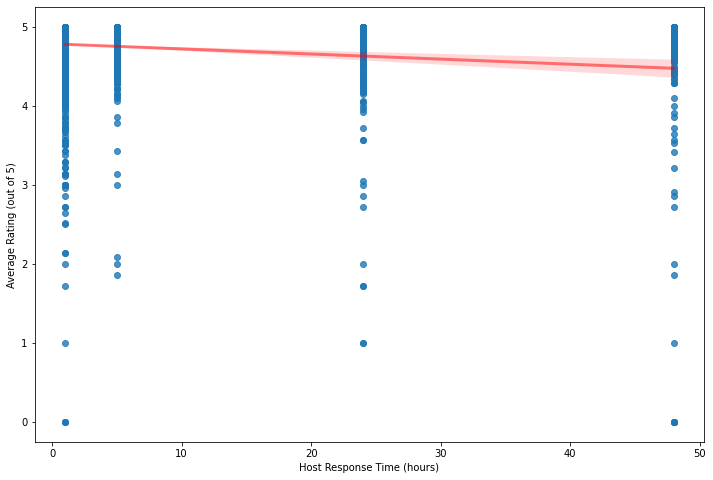

In [66]:
plt.figure(figsize=(12,8))
sb.regplot(x="host_response_time_float", y="avg_rating", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Host Response Time (hours)')
plt.ylabel('Average Rating (out of 5)')
plt.show()

The regression plot shows a negative trend in the average rating related to the time it takes the host to respond to messages and booking requests.

<h4>Average Rating v. Response Rate</h4>

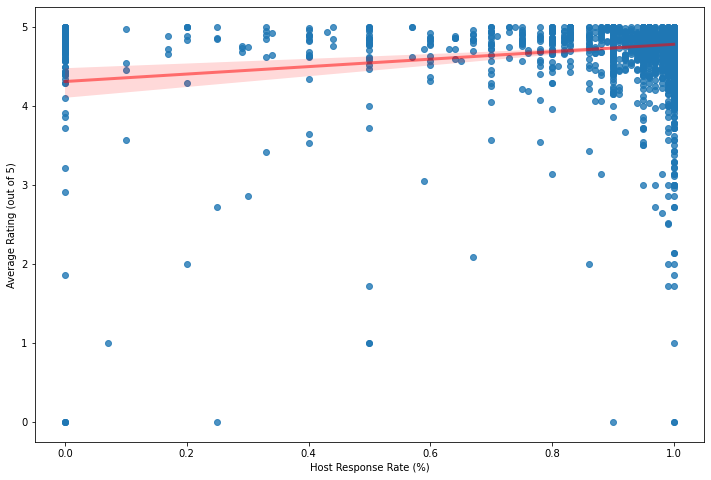

In [67]:
plt.figure(figsize=(12,8))
sb.regplot(x="host_response_rate", y="avg_rating", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Host Response Rate (%)')
plt.ylabel('Average Rating (out of 5)')
plt.show()

In general, the higher the hosts' response rate is, the higher their average listing rating is.

<h4>Average Rating v. Number of Verifications</h4>

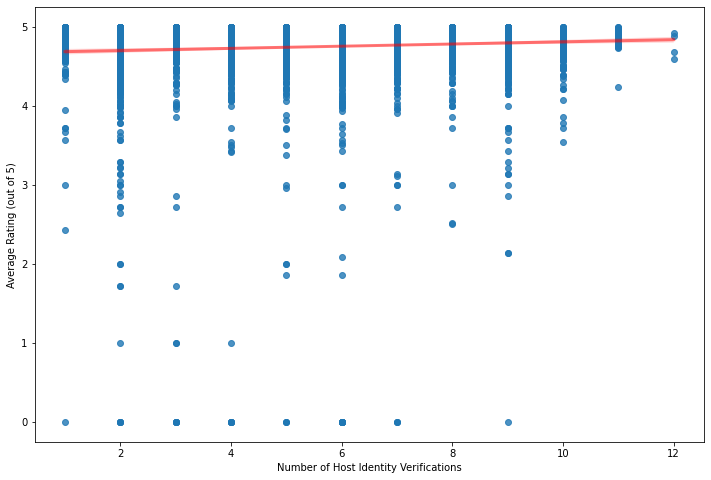

In [68]:
plt.figure(figsize=(12,8))
sb.regplot(x="no_of_verif", y="avg_rating", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Number of Host Identity Verifications')
plt.ylabel('Average Rating (out of 5)')
plt.show()

While it appears there is a positive correlation between the average rating and the number of verifications a host has, it is very small.

<h3>Word Clouds</h3>

Some of the columns are free text entered by the hosts.  We will look at the word clouds to explore which keywords are used most frequently.  The data fields we will focus on are:
- 'description': this is the hosts' description of their listings
- 'neighborhood_overview': the hosts' description of the neighborhood
- 'host_about': the hosts' description of themselves

First, let's define a function to make it easy to generate our wordclouds from the input column:

In [69]:
stopwords = STOPWORDS
stopwords.update(['description','neighborhood_overview','object','dtype','host_about',
                 'inv','t','name','don','neig','m','o','neig','nei'])
def Mywordcloud(data, title = None):   
    wc = WordCloud(
    background_color = "white",
    stopwords = stopwords,
    height = 600,
    width = 600
    ).generate(str(data))
    fig = plt.figure(1, figsize=(10, 10))
    plt.axis('off')
    if title:
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)
    plt.imshow(wc)
    plt.show()

<h4>Listing Description</h4>

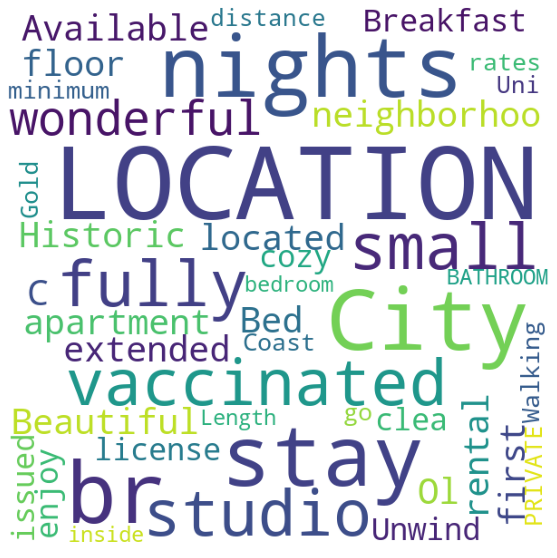

In [70]:
Mywordcloud(dat['description'].dropna())

In the description field, we see a lot of key words show up that would make sense to be in the field.  Interestingly the work "vaccinated" has already made it into the one of the most used words.

<h4>Neighborhood Overview</h4>

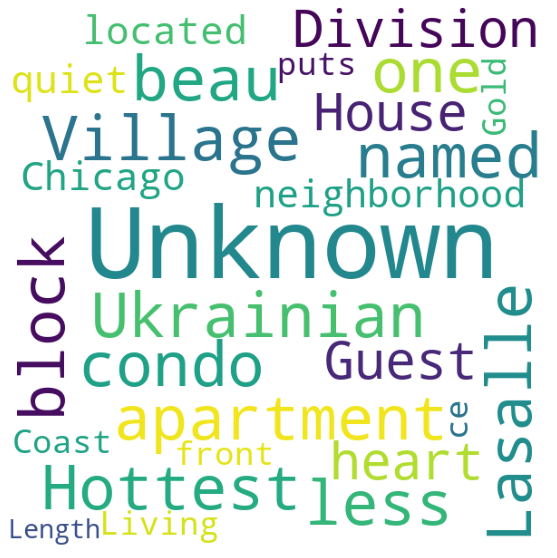

In [71]:
Mywordcloud(dat['neighborhood_overview'].dropna())

In the neighborhood overview, there are once again a lot of words that you would expect to show up when describing a location.  "Ukranian" is a village within Chicago, along with "Lasalle".

<h4>About the Host</h4>

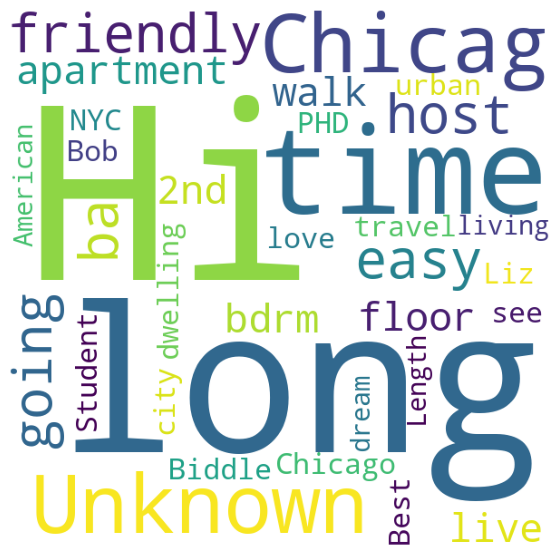

In [72]:
Mywordcloud(dat['host_about'].dropna())

Once again here we see common words to describe hosts, along with some of the more popular names in the area.

<h3>Joint Plots</h3>

<h4>Distance center from the city vs. Average rating</h4>

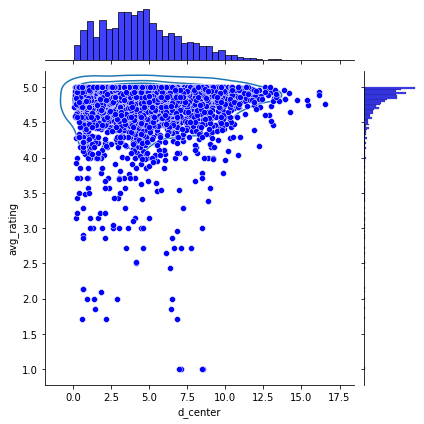

In [73]:
non_zero_avg = dat[dat['avg_rating']>0]
ax = sb.jointplot(x="d_center", y="avg_rating", data=non_zero_avg[['d_center','avg_rating']],color='b')
ax.plot_joint(sb.kdeplot, zorder=0, n_levels=6)
plt.xlabel('Distance from the center of Chicago')
plt.ylabel('Average Rating (out of 5)')
plt.show()

According to above plot, customers tend to rate the places that are closing to the center of Chicago with the score from 4 to 5 rating.

<h4>Distance center from the city vs. Average rating</h4>

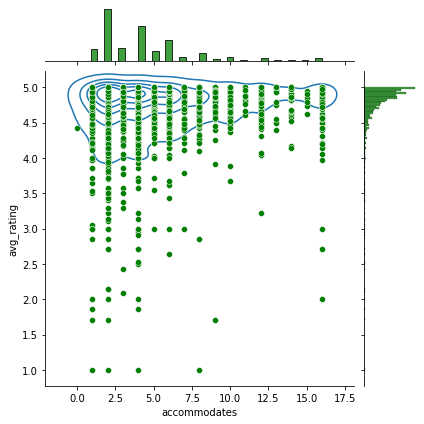

In [74]:
ax = sb.jointplot(x="accommodates", y="avg_rating", data=non_zero_avg[['accommodates','avg_rating']],color='g')
ax.plot_joint(sb.kdeplot, zorder=0, n_levels=6)
plt.xlabel('Accomodates (people)')
plt.ylabel('Average Rating (out of 5)')
plt.show()

Smaller accommodations tend to have higher average of rating score.

<h4>Accomodation vs. Availability for 30 days</h4>

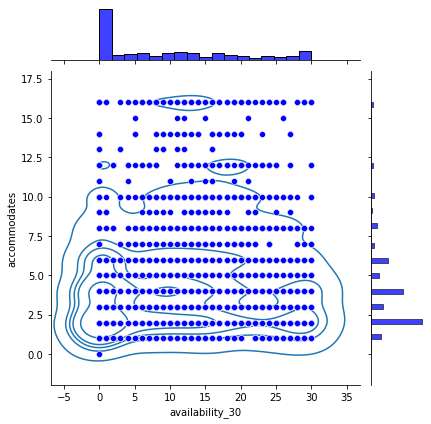

In [75]:
ax1 = sb.jointplot(x="availability_30", y="accommodates", data=dat[['availability_30','accommodates']],color='b')
ax1.plot_joint(sb.kdeplot, zorder=0, n_levels=6)
plt.xlabel('Availabillity Next 30d')
plt.ylabel('Accomodates (people)')
plt.show()

According to above plot, we can see there are big density starting from bottom left corner and spreading to the top and right. We can see that smaller accommodations have lower chance of being availability in 30 days.

<h4>Accommodation vs. Distance from center of Chicago</h4>

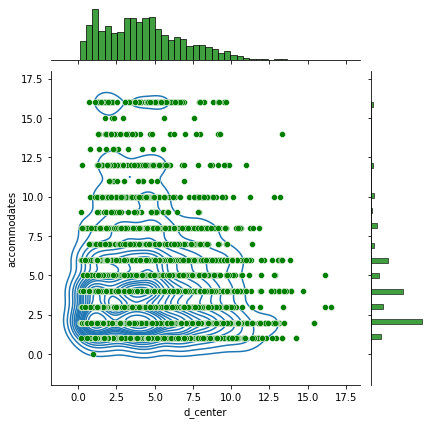

In [76]:
ax = sb.jointplot(x="d_center", y="accommodates", data=dat[['d_center','accommodates']],color='g')
ax.plot_joint(sb.kdeplot, zorder=0, n_levels=17)
plt.xlabel('Distance from the center of Chicago')
plt.ylabel('Accomodates (people)')
plt.show()

We can see that smaller accommodations tend to stay close to the city.

<h3>Heat Map</h3>

Geospatial visualization

The geography of Chicago has a wide spead city area with downtown and suburban locations available for properties to vary with higher pricing as we move towards the downtown. 
We will consider the following variables for observing varying prices for different locations
- 'latitude' geographic cordinates of the host's property location
- 'longitude' geographic cordinates of the host's property location
- 'price' Tagged price of the property hosted by hosts.

We take the 'latitude' and 'longitude' variables for identifying the property location hotspots, and 'price' variable to define the intensity of high and low priced rentals.

The Coordinates channel uses the location field, which contains arrays of latitude-longitude pairs. 

The Intensity field uses the price field, which contains rental price for each property.

In [77]:
# mark the loacation of each the property on the map of chicago
map = folium.Map([41.881832,-87.623177], zoomstart= 10)
for index, row in dat.iterrows():
    folium.CircleMarker([row['latitude'],row['longitude']],
                       radius=5,
                       popup=row['neighbourhood_cleansed'], color='#7ECC49',
                       fill_color="#FFFF00").add_to(map)
map

In [78]:
#starting lat and long are center of chicago
lat1 = 41.881832
long1 = -87.623177
map = folium.Map(location=[lat1, long1], zoom_start=10)
#convert data into list format
heat_data = [[row['latitude'],row['longitude'],row['price']] for index, row in dat.iterrows()]
#add to map, gradient for the price value
#plotting the heatmap
map.add_child(HeatMap(heat_data, radius = 15, gradient={'0':'Navy', '0.25':'Blue','0.50':'Green', '0.75':'Yellow','1': 'Red'}))
map

<h2 align='center'>Dimension Reduction</h2>

In [79]:
#dat.info()

<h3>Principal Component Analysis</h3>

In order to complete a Principal Component Analysis, we need to only select the numeric (non-datetime) values and drop values with NaNs.

In [80]:
# Select only numeric values
dat_pre_norm = dat.select_dtypes(exclude=['object'])

# Cannot scale datetime objects, so remove those columns
dat_pre_norm = dat_pre_norm.drop(['first_review','last_review','host_since','last_scraped'],axis=1)

# Drop off id columns
dat_pre_norm = dat_pre_norm.drop(['id','host_id'],axis=1)

# Drop remaining NaN values
dat_pre_norm = dat_pre_norm.dropna()

Next we will scale the data.

In [81]:
dat_norm = scale(dat_pre_norm)

<h4>PCA with all variables</h4>

For the fist PCA, we will include all of the variables (i.e. all columns from the selection above).

In [82]:
pca1 = PCA(n_components=len(dat_pre_norm.columns))

pca1.fit(dat_norm)

PCA(n_components=49)

In [83]:
var = pca1.explained_variance_ratio_
var1 = np.cumsum(np.round(pca1.explained_variance_ratio_, decimals=4)*100)
print(var1)

[14.61 24.25 31.99 39.31 45.92 51.49 55.95 59.64 62.93 66.12 68.56 70.82
 73.02 75.12 77.17 79.15 80.98 82.73 84.42 85.98 87.37 88.66 89.74 90.77
 91.73 92.66 93.52 94.32 95.09 95.73 96.24 96.69 97.12 97.52 97.9  98.26
 98.62 98.95 99.26 99.53 99.74 99.93 99.97 99.97 99.97 99.97 99.97 99.97
 99.97]


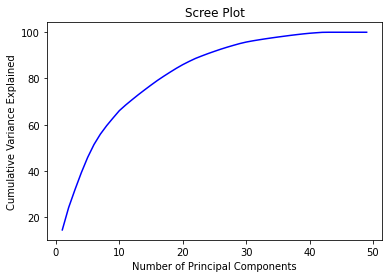

In [84]:
var1 = pd.DataFrame(var1, index=np.arange(1,int(len(dat_pre_norm.columns))+1))
plt.plot(var1,color='blue')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.show()

<h4>PCA with 80% variance explained</h4>

Taking the first 17 principal components will correspond to 80% of the variance explained.

In [85]:
pca17 = PCA(n_components=17)
pca17.fit(dat_norm)
data_pca17 = pca17.transform(dat_norm)

# Convert the numpy array to pandas DataFrame
data_pca17 = pd.DataFrame(data_pca17)
data_pca17.columns = ["PC"+str(i) for i in range(1,18)]

In [86]:
data_pca17.corr()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
PC1,1.000000e+00,1.434075e-11,-2.871697e-11,-1.629606e-11,3.599914e-11,-1.225532e-10,1.358133e-10,1.198355e-10,1.802348e-09,-1.973985e-09,-2.678806e-09,-1.623365e-09,-5.699834e-09,1.362847e-08,1.401716e-10,5.248008e-10,-1.078061e-08
PC2,1.434075e-11,1.000000e+00,-1.483835e-10,-9.548987e-11,6.010032e-10,-1.676823e-09,1.831054e-09,3.002755e-09,2.119554e-08,-2.339262e-08,-2.005941e-08,6.943447e-09,-9.258372e-09,1.547277e-07,-4.810302e-09,-3.426394e-08,-3.404596e-08
PC3,-2.871697e-11,-1.483835e-10,1.000000e+00,1.983088e-10,-2.843512e-10,1.087107e-09,-1.550065e-09,9.019622e-10,-1.888055e-08,2.129782e-08,4.149778e-08,3.528852e-08,1.108461e-07,-1.509284e-07,-6.285250e-09,-3.826889e-08,1.953169e-07
PC4,-1.629606e-11,-9.548987e-11,1.983088e-10,1.000000e+00,4.366894e-10,1.578001e-09,2.699077e-09,-1.094171e-08,-1.918724e-08,1.018744e-08,-2.361056e-08,5.529008e-08,1.640404e-08,-7.993829e-08,-6.565180e-09,-3.784423e-08,5.625556e-08
PC5,3.599914e-11,6.010032e-10,-2.843512e-10,4.366894e-10,1.000000e+00,-5.371521e-09,9.116819e-09,4.353819e-09,6.645823e-08,-8.146119e-08,-8.566661e-08,8.627180e-08,1.884788e-08,5.246333e-07,-2.754933e-08,-1.878550e-07,-2.151067e-08
PC6,-1.225532e-10,-1.676823e-09,1.087107e-09,1.578001e-09,-5.371521e-09,1.000000e+00,-1.450479e-08,-4.036169e-08,-2.078723e-07,2.189709e-07,1.298651e-07,-7.585819e-08,-3.977144e-08,-1.440506e-06,5.558830e-08,3.603680e-07,1.412433e-07
PC7,1.358133e-10,1.831054e-09,-1.550065e-09,2.699077e-09,9.116819e-09,-1.450479e-08,1.000000e+00,-1.356409e-08,1.888692e-07,-2.561612e-07,-3.869420e-07,2.731024e-07,-1.895433e-07,1.643008e-06,-8.330073e-08,-4.816187e-07,-4.293215e-07
PC8,1.198355e-10,3.002755e-09,9.019622e-10,-1.094171e-08,4.353819e-09,-4.036169e-08,-1.356409e-08,1.000000e+00,4.409177e-07,-3.498181e-07,4.015708e-07,-4.666346e-08,1.112288e-06,2.357023e-06,-9.489993e-08,-8.818072e-07,1.268772e-06
PC9,1.802348e-09,2.119554e-08,-1.888055e-08,-1.918724e-08,6.645823e-08,-2.078723e-07,1.888692e-07,4.409177e-07,1.000000e+00,-2.804861e-06,-2.128345e-06,3.577190e-07,-1.141577e-06,1.866881e-05,-4.795851e-07,-3.748823e-06,-4.351968e-06
PC10,-1.973985e-09,-2.339262e-08,2.129782e-08,1.018744e-08,-8.146119e-08,2.189709e-07,-2.561612e-07,-3.498181e-07,-2.804861e-06,1.000000e+00,2.936690e-06,-8.791332e-07,1.763360e-06,-2.076965e-05,5.771630e-07,4.407874e-06,5.325028e-06


From the above correlation table, we can find that the pairwise correlations between two components are close to zeros. This means that all these components are orthogonal (not correlated). There is no multicollinearity among principal components.

In order to graph the results, we will restrict the PCA analysis to two components.

<h4>PCA with 2 components</h4>

In [87]:
# Select the number of components
pca2 = PCA(n_components=2)
pca2.fit(dat_norm)
dat_pca2 = pca2.fit_transform(dat_norm)

dat_pca2 = pd.DataFrame(dat_pca2)
dat_pca2.columns = ["PC"+str(i) for i in range(1,3)]

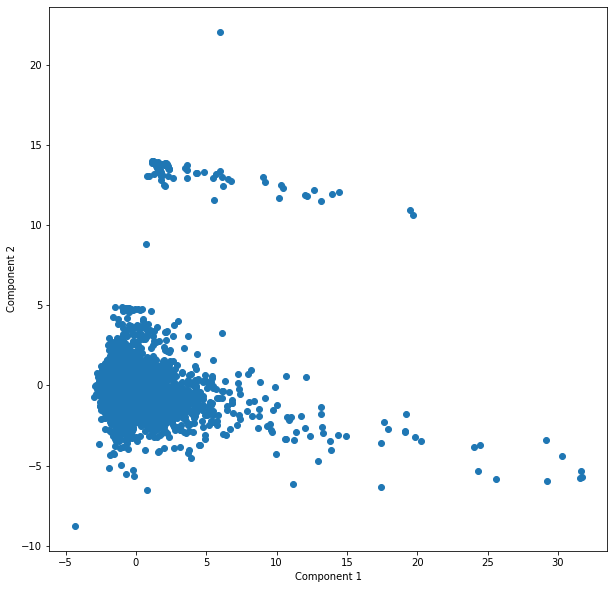

In [88]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(dat_pca2['PC1'], dat_pca2['PC2'])
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

It appears that there are three distinct groups in the graph, which are determined by the PCA2 values.

We can look at the loadings used to calculate the components from the original variables:

In [89]:
pd.DataFrame(pca2.components_.transpose(),
             index=dat_pre_norm.loc[:,:].columns,
             columns=["PC"+str(i) for i in range(1,3)])

,PC1,PC2
host_response_rate,-0.116633,0.052000
host_acceptance_rate,-0.075567,0.009566
host_is_superhost,-0.139934,0.009067
host_has_profile_pic,0.001557,0.004431
host_identity_verified,-0.016920,0.043162
latitude,-0.063412,-0.006922
longitude,0.065793,0.058627
accommodates,-0.020472,-0.186714
bedrooms,-0.020232,-0.175218
beds,-0.014021,-0.180053


In [90]:
dat_pca2[dat_pca2['PC2']>20]

,PC1,PC2
2108,5.973475,22.031413


In [91]:
#dat_pre_norm.loc[dat_pre_norm.index[dat_pca2[dat_pca2['PC2']>15].index]].transpose()

<h2 align="center">Predictive Methods</h2>

In this section, we will look at different predictive models for various target variables.



<h3>K-Nearest Neighbors - Rating Prediction</h3>

We will use KNN modeling to build a model to predict the average rating of new listings based on the other predictors.  First we need to load the appropriate packages.

In [92]:
from sklearn import neighbors
from sklearn import model_selection
from sklearn import metrics
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

Next we will divide the variables into the independent (X) and dependent, or target, variable (y).  In this model, we will be attempting to predict 'price'.

We also already selected the appropriate columns for the PCA analysis earlier, and can start with the same pre-normalized data.

In [93]:
X_svm = dat_pre_norm.drop(['review_scores_rating'],axis=1)
y_svm = dat_pre_norm['review_scores_rating']

Since the other rating predictors would not be available for future data, these should be dropped from the predictors as well.

In [94]:
X_svm = dat_pre_norm.drop(['review_scores_accuracy','review_scores_cleanliness',
                           'review_scores_checkin','review_scores_communication',
                           'review_scores_location','review_scores_value'],
                           axis=1)

In order to test the performance of our model, we need to split the original dataset into test and train subsets.  We will use a 20/80 test/train split.

In [95]:
y_svm_train,y_svm_test,X_svm_train,X_sm_test = train_test_split(y_svm, X_svm,
                                                 test_size=0.2,
                                                 random_state=123)

In [96]:
pd.DataFrame([y_svm_train.describe(),y_svm_test.describe()],
            index=['train description','test description'])

,count,mean,std,min,25%,50%,75%,max
train description,3402.0,4.702787,0.467832,0.0,4.62,4.83,4.96,5.0
test description,851.0,4.739389,0.377377,1.0,4.67,4.84,4.96,5.0


Above we can see that the split is fairly eqaully distibuted.

Next we will scale the data for the analysis.

In [97]:
# Create scalar
scaler = preprocessing.MinMaxScaler().fit(X_svm_train)

# Scale training data
X_train_scale = scaler.transform(X_svm_train)
X_train_scale = pd.DataFrame(X_train_scale)
X_train_scale.columns = X_svm_train.columns

# Scale test data
X_test_scale = scaler.transform(X_sm_test)
X_test_scale = pd.DataFrame(X_test_scale)
X_test_scale.columns = X_sm_test.columns

Now we will iterate through various values of k in order to tune the model.

In [98]:
for k in range(20):
    k = k + 1
    knn = neighbors.KNeighborsRegressor(n_neighbors = k, 
                                         weights = 'uniform', 
                                         algorithm = 'auto')
    knn.fit(X_train_scale, y_svm_train)
    pred_y = knn.predict(X_test_scale)
    if k==1:
        k_final = k
        RMSE_final = round(metrics.mean_squared_error(y_svm_test, pred_y,squared=False),3)
    else:
        if round(metrics.mean_squared_error(y_svm_test, pred_y,squared=False),3) < RMSE_final:
            k_final = k
            RMSE_final = round(metrics.mean_squared_error(y_svm_test, pred_y,squared=False),3)
    print("RMSE is ", round(metrics.mean_squared_error(y_svm_test, pred_y,squared=False),3)," for k =",k)

RMSE is  0.313  for k = 1
RMSE is  0.288  for k = 2
RMSE is  0.275  for k = 3
RMSE is  0.27  for k = 4
RMSE is  0.273  for k = 5
RMSE is  0.28  for k = 6
RMSE is  0.284  for k = 7
RMSE is  0.288  for k = 8
RMSE is  0.292  for k = 9
RMSE is  0.293  for k = 10
RMSE is  0.297  for k = 11
RMSE is  0.298  for k = 12
RMSE is  0.301  for k = 13
RMSE is  0.304  for k = 14
RMSE is  0.305  for k = 15
RMSE is  0.306  for k = 16
RMSE is  0.307  for k = 17
RMSE is  0.308  for k = 18
RMSE is  0.312  for k = 19
RMSE is  0.313  for k = 20


In [99]:
print("The best k value is ", k_final, " with a RMSE of ", RMSE_final)

The best k value is  4  with a RMSE of  0.27


## Random Forest Classifier- predicting the most preferred room type for customers

We will use RandomForestClassifier to predict the most preferred room type based on customer satisfaction (ratings and reviews).

In [100]:
from sklearn.ensemble import RandomForestClassifier

In [101]:
X_rf = dat.drop(['property_type','id','last_scraped','name','description','neighborhood_overview','host_id',
                'host_name','host_since','host_about','host_location','host_response_time',
                 'host_response_rate','host_acceptance_rate','host_is_superhost','host_neighbourhood',
                 'host_verifications','host_has_profile_pic','host_identity_verified','neighbourhood_cleansed',
                 'latitude','longitude','room_type','accommodates','bathrooms_text','bedrooms','beds','amenities',
                 'price','minimum_nights','maximum_nights','minimum_minimum_nights','maximum_minimum_nights',
                 'minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm',
                 'has_availability','availability_30','availability_60','availability_90','availability_365',
                 'first_review','last_review','license','instant_bookable','calculated_host_listings_count',
                 'calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms',
                 'calculated_host_listings_count_shared_rooms','bathrooms','host_age','host_response_inADay',
                 'host_response_time_float','no_of_verif','no_of_amen','d_center'], axis =1)

y_rf = dat['room_type']

In [102]:
X_rf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6445 entries, 0 to 6454
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   number_of_reviews            6445 non-null   int64  
 1   number_of_reviews_ltm        6445 non-null   int64  
 2   number_of_reviews_l30d       6445 non-null   int64  
 3   review_scores_rating         6445 non-null   float64
 4   review_scores_accuracy       6445 non-null   float64
 5   review_scores_cleanliness    6445 non-null   float64
 6   review_scores_checkin        6445 non-null   float64
 7   review_scores_communication  6445 non-null   float64
 8   review_scores_location       6445 non-null   float64
 9   review_scores_value          6445 non-null   float64
 10  reviews_per_month            6445 non-null   float64
 11  avg_rating                   5428 non-null   float64
dtypes: float64(9), int64(3)
memory usage: 912.6 KB


We can see that there are some missing values in the predictors, so we fill those missing values.

In [103]:
X_rf['avg_rating']=X_rf['avg_rating'].fillna(method='ffill')

In [104]:
nullseries = X_rf.isnull().sum()
print(nullseries[nullseries > 0])

Series([], dtype: int64)


We now split the data into train and test datasets by splitting the 80% train and 20% test data via train_test_split() method 

In [105]:
train_y, test_y, train_X, test_X= train_test_split(y_rf, X_rf,
                                                   test_size=0.2,
                                                   random_state=123) 

In [106]:
train_X.shape

(5156, 12)

In [107]:
train_y.shape

(5156,)

In [108]:
train_y.unique()

array(['Private room', 'Entire home/apt', 'Hotel room', 'Shared room'],
      dtype=object)

In [109]:
test_X.shape

(1289, 12)

In [110]:
test_y.shape

(1289,)

We scale the training and testing data for obtaining optimal results from the RF model.

In [111]:
scaler = preprocessing.MinMaxScaler().fit(train_X)

train_X_scale = scaler.transform(train_X)
train_X_scale = pd.DataFrame(train_X_scale)
train_X_scale.columns = train_X.columns

train_X_scale.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
number_of_reviews,5156.0,0.034455,0.056593,0.0,0.001519,0.011390,0.042521,1.0
number_of_reviews_ltm,5156.0,0.011897,0.024662,0.0,0.000000,0.003209,0.017112,1.0
number_of_reviews_l30d,5156.0,0.012526,0.026648,0.0,0.000000,0.000000,0.018182,1.0
review_scores_rating,5156.0,0.795179,0.353988,0.0,0.880000,0.958000,0.988000,1.0
review_scores_accuracy,5156.0,0.805842,0.357445,0.0,0.904000,0.972000,0.994000,1.0
review_scores_cleanliness,5156.0,0.794266,0.353835,0.0,0.870000,0.956000,0.990000,1.0
review_scores_checkin,5156.0,0.815647,0.360025,0.0,0.932000,0.984000,1.000000,1.0
review_scores_communication,5156.0,0.814529,0.360906,0.0,0.928000,0.986000,1.000000,1.0
review_scores_location,5156.0,0.804692,0.355843,0.0,0.900000,0.968000,0.994000,1.0
review_scores_value,5156.0,0.788774,0.351555,0.0,0.874000,0.948000,0.978000,1.0


In [112]:
test_X_scale = scaler.transform(test_X)
test_X_scale = pd.DataFrame(test_X_scale)
test_X_scale.columns = test_X.columns

test_X_scale.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
number_of_reviews,1289.0,0.034473,0.054278,0.0,0.001519,0.011390,0.041002,0.405467
number_of_reviews_ltm,1289.0,0.011576,0.018448,0.0,0.000000,0.004278,0.017112,0.262032
number_of_reviews_l30d,1289.0,0.012053,0.018467,0.0,0.000000,0.000000,0.018182,0.200000
review_scores_rating,1289.0,0.780009,0.368987,0.0,0.866000,0.960000,0.990000,1.000000
review_scores_accuracy,1289.0,0.789632,0.372501,0.0,0.892000,0.974000,0.996000,1.000000
review_scores_cleanliness,1289.0,0.779494,0.369619,0.0,0.858000,0.960000,0.994000,1.000000
review_scores_checkin,1289.0,0.798528,0.376660,0.0,0.928000,0.982000,1.000000,1.000000
review_scores_communication,1289.0,0.799015,0.376700,0.0,0.918000,0.986000,1.000000,1.000000
review_scores_location,1289.0,0.786884,0.372650,0.0,0.892000,0.970000,0.994000,1.000000
review_scores_value,1289.0,0.772458,0.367358,0.0,0.858000,0.948000,0.978000,1.000000


In [113]:
rf = RandomForestClassifier(n_estimators=7, max_features=9, random_state=123)

In [114]:
rf.fit(train_X_scale, train_y)

RandomForestClassifier(max_features=9, n_estimators=7, random_state=123)

In [115]:
# We use feature importance method to define the best predictors.
rf.feature_importances_

feature_importances = pd.DataFrame(rf.feature_importances_,
                                   index = train_X_scale.columns,
                                   columns=['importance'])
feature_importances = feature_importances.sort_values('importance',ascending=False)

<AxesSubplot:title={'center':'Feature Importances of Ratings and Reviews for properties'}>

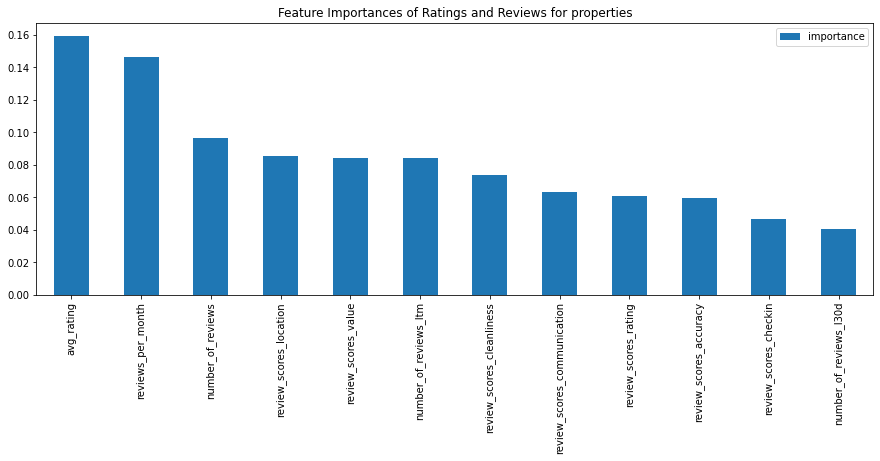

In [116]:
feature_importances.plot(kind = 'bar',figsize=(15,5),
                         title='Feature Importances of Ratings and Reviews for properties')

**From the above feature_importances method, we can see that avg_rating, reviews_per_month, number_of_reviews are variables of high importance and these variables have high significance in training RF classifier.**

In [117]:
pred_y_rf = rf.predict(test_X_scale)

In [118]:
metrics.accuracy_score(test_y, pred_y_rf)

0.704422032583398

In [119]:
pred_y_rf

array(['Entire home/apt', 'Private room', 'Entire home/apt', ...,
       'Entire home/apt', 'Private room', 'Entire home/apt'], dtype=object)

In [120]:
# Based on model prediction, we count the number of values obtained for each room type.
p = pred_y_rf.tolist()

In [121]:
count = dict()
for i in p:
    count[i]=count.get(i,0)+1
count

{'Entire home/apt': 1068, 'Private room': 220, 'Hotel room': 1}

In [122]:
data = count
pd.DataFrame.from_dict(data, orient='index', dtype=None, columns=['Preferred House type'])

,Preferred House type
Entire home/apt,1068
Private room,220
Hotel room,1


Based on RF classifier result without hyper parameter tuning with get accuracy score of 70.44%, now let's tune hyper parameters and observe the difference in predicting the the most preferred room type based on ratings and reviews.

In [123]:
## RF Classifier with hyper-parameter tuning

In [124]:
parameters = {'criterion': ['gini', 'entropy'],
              'n_estimators':[100,200,300,400,500],
              'max_features':[1,3,5,7,9,10,11],
              'random_state':[123]}
parameters

{'criterion': ['gini', 'entropy'],
 'n_estimators': [100, 200, 300, 400, 500],
 'max_features': [1, 3, 5, 7, 9, 10, 11],
 'random_state': [123]}

In [125]:
rf2 = RandomForestClassifier()

In [126]:
from sklearn.model_selection import GridSearchCV

In [127]:
grid_rf = GridSearchCV(rf2, parameters, scoring='accuracy', cv=5)

In [128]:
import time
start = time.time()
print('Start time :'+ time.strftime('%m/%d/%Y %H:%M:%S'))

grid_rf.fit(train_X_scale, train_y)

end = time.time()
print('End time :'+ time.strftime('%m/%d/%Y %H:%M:%S'))
print('Execution Time in seconds :'+ str(end - start))

Start time :12/04/2021 17:46:13
End time :12/04/2021 18:01:13
Execution Time in seconds :900.3628668785095


In [129]:
grid_rf.best_params_

{'criterion': 'entropy',
 'max_features': 7,
 'n_estimators': 300,
 'random_state': 123}

In [130]:
pred_y_rf2 = grid_rf.predict(test_X_scale)

In [131]:
metrics.accuracy_score(test_y, pred_y_rf2)

0.7276958882854926

In [132]:
p = pred_y_rf2.tolist()

In [133]:
count = dict()
for i in p:
    count[i]=count.get(i,0)+1
count

{'Entire home/apt': 1116, 'Private room': 173}

In [134]:
data = count
pd.DataFrame.from_dict(data, orient='index', dtype=None, columns=['Preferred House type'])

,Preferred House type
Entire home/apt,1116
Private room,173


**The RF Classifier with hyper parameter tuning gives us accuracy score of 72.76% with best optimal hyper parameters.**

The above result obtained from the model, we can depict that the preferred room type based on customer ratings and reviews is "Entire home/apt" followed by "Private room", "Hotel room", and lastly "Shared Room".

---


<h3>K-Nearest Neighbors - Price Prediction</h3>

We will use KNN modeling to build a model to predict the price of new listings based on the other predictors.

In [129]:
from sklearn.preprocessing import StandardScaler

**Preprocess Data**

In [130]:
X_price = dat_pre_norm.drop(['price'],axis=1)
y_price = dat_pre_norm['price']

**Data Partition**
We use the sklearn.model_selection.train_test_split() method to split the dataset into test and training sets. Major parameters are:

- test_size

- train_size

- random_state

In [131]:
y_price_train,y_price_test,X_price_train,X_price_test = train_test_split(y_price, X_price,
                                                 test_size=0.2,
                                                 random_state=123)

**Normalize Data**
Because the k-NN needs to calculate distance between observations, it's better to normalize data as we have variables measured in different scales.

In [132]:
pd.DataFrame([y_price_train.describe(),y_price_test.describe()],
            index=['train description','test description'])

,count,mean,std,min,25%,50%,75%,max
train description,3402.0,166.044680,142.664897,0.0,79.0,121.0,200.0,999.0
test description,851.0,161.740306,140.414285,0.0,77.0,122.0,194.0,999.0


In [133]:
# Create a scaler to do the transformation
scaler = StandardScaler().fit(X_price_train)
# Transform training X
X_price_train_scaled = scaler.transform(X_price_train)
X_price_train_scaled = pd.DataFrame(X_price_train_scaled)
X_price_train_scaled.columns = X_price_train.columns

In [134]:
# Transform test X
X_price_test_scaled = scaler.transform(X_price_test)
X_price_test_scaled = pd.DataFrame(X_price_test_scaled)
X_price_test_scaled.columns = X_price_test.columns

**Tune the k-NN Regressor**
The choice of the paramter value k has impact on the performance of the k-NN algorithm.
In the following, we tune the k parameter based on Root Mean Squared Error and R2.

In [135]:
from sklearn import neighbors
from sklearn import metrics
for k in range(20):
    k = k + 1
    knn = neighbors.KNeighborsRegressor(n_neighbors = k, 
                                         weights='uniform', 
                                         algorithm='auto')
    knn.fit(X_price_train_scaled, y_price_train)
    pred_y = knn.predict(X_price_test_scaled)
    rmse = metrics.mean_squared_error(y_price_test, pred_y, squared = False)
    
    print("Root Mean Squared Error: {:.2f}".format(rmse)," for k=",k)

Root Mean Squared Error: 112.51  for k= 1
Root Mean Squared Error: 105.40  for k= 2
Root Mean Squared Error: 98.48  for k= 3
Root Mean Squared Error: 96.90  for k= 4
Root Mean Squared Error: 97.16  for k= 5
Root Mean Squared Error: 95.48  for k= 6
Root Mean Squared Error: 93.73  for k= 7
Root Mean Squared Error: 94.47  for k= 8
Root Mean Squared Error: 95.49  for k= 9
Root Mean Squared Error: 95.98  for k= 10
Root Mean Squared Error: 96.38  for k= 11
Root Mean Squared Error: 96.78  for k= 12
Root Mean Squared Error: 96.91  for k= 13
Root Mean Squared Error: 97.55  for k= 14
Root Mean Squared Error: 98.11  for k= 15
Root Mean Squared Error: 98.26  for k= 16
Root Mean Squared Error: 97.82  for k= 17
Root Mean Squared Error: 98.04  for k= 18
Root Mean Squared Error: 98.65  for k= 19
Root Mean Squared Error: 98.46  for k= 20


In [136]:
for k in range(20):
    k = k + 1
    knn = neighbors.KNeighborsRegressor(n_neighbors = k, 
                                         weights='uniform', 
                                         algorithm='auto')
    knn.fit(X_price_train_scaled, y_price_train)
    pred_y = knn.predict(X_price_test_scaled)
    r2 = metrics.r2_score(y_price_test, pred_y)
    
    print("R2 score: {:.3f}".format(r2)," for k=",k)

R2 score: 0.357  for k= 1
R2 score: 0.436  for k= 2
R2 score: 0.508  for k= 3
R2 score: 0.523  for k= 4
R2 score: 0.521  for k= 5
R2 score: 0.537  for k= 6
R2 score: 0.554  for k= 7
R2 score: 0.547  for k= 8
R2 score: 0.537  for k= 9
R2 score: 0.532  for k= 10
R2 score: 0.528  for k= 11
R2 score: 0.524  for k= 12
R2 score: 0.523  for k= 13
R2 score: 0.517  for k= 14
R2 score: 0.511  for k= 15
R2 score: 0.510  for k= 16
R2 score: 0.514  for k= 17
R2 score: 0.512  for k= 18
R2 score: 0.506  for k= 19
R2 score: 0.508  for k= 20


- k=7 has highest performance based on R2 score and Root Mean Squared Error

<h3 align='center'>Summary of Findings</h3>

Throughout our analysis we consistently found that the data supported most common understandings of how the variables related to one another.  For example, listings that were closer to the center of the city on average were more expensive, accomadated less amount of people, and had higher ratings.  We are even able to make simple regression models to predict variables based on another variable.

Towards the end of the analysis we were able to develop more complicated regression and classification models based on machine learning algorithms.  The more robust models are designed to predict variables based on a larger number of other indicator (or independant) variables.  However, with the high dimensionality of the models their uses may be limited.

Using Random Forest Classifier we were able to predict the most preferred house_type by customers. The analysis is conducted based on customer ratings and reviews with independent variables like number_of_reviews, reviews_per_month, avg_rating, number_of_reviews_ltm (last twelve months), etc. We used scaled variables for training the model and received an accuracy_score of 72%. The model prediction enabled us to identify and rank the types of room that has the highest probability to get choosed/selected by customers.